In [ ]:
import tensorflow as tf

# Check if we have a GPU available
if not tf.config.list_physical_devices('GPU'):
    print("No GPU detected. Using CPU...")
    device = "/cpu:0"
else:
    device = "/gpu:0"

In [ ]:
! pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"mohamedmaher5","key":"91a688556b6a9fab04173a86be148128"}'}

In [ ]:
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download misrakahmed/vegetable-image-dataset

 96% 513M/534M [00:05<00:00, 90.0MB/s]
100% 534M/534M [00:05<00:00, 107MB/s] 


In [ ]:
! unzip vegetable-image-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Vegetable Images/train/Radish/0001.jpg  
  inflating: Vegetable Images/train/Radish/0002.jpg  
  inflating: Vegetable Images/train/Radish/0003.jpg  
  inflating: Vegetable Images/train/Radish/0004.jpg  
  inflating: Vegetable Images/train/Radish/0005.jpg  
  inflating: Vegetable Images/train/Radish/0006.jpg  
  inflating: Vegetable Images/train/Radish/0007.jpg  
  inflating: Vegetable Images/train/Radish/0008.jpg  
  inflating: Vegetable Images/train/Radish/0009.jpg  
  inflating: Vegetable Images/train/Radish/0010.jpg  
  inflating: Vegetable Images/train/Radish/0011.jpg  
  inflating: Vegetable Images/train/Radish/0012.jpg  
  inflating: Vegetable Images/train/Radish/0013.jpg  
  inflating: Vegetable Images/train/Radish/0014.jpg  
  inflating: Vegetable Images/train/Radish/0015.jpg  
  inflating: Vegetable Images/train/Radish/0016.jpg  
  inflating: Vegetable Images/train/Radish/0017.jpg  
  inflating: Vegetable Images/t

In [ ]:
train_path = r'/content/Vegetable Images/train'
test_path = r'/content/Vegetable Images/test'
val_path = r'/content/Vegetable Images/validation'

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from PIL import Image
import os
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout


In [ ]:
code = {'Bean' : 0, 'Bitter_Gourd' :1 , 'Bottle_Gourd' : 2, 'Brinjal' : 3, 'Broccoli' : 4,'Cabbage' : 5, 'Capsicum' : 6, 'Carrot' : 7,  'Cauliflower' : 8, 'Cucumber' : 9,  'Papaya' : 10,  'Potato' :11,  'Pumpkin' :12, 'Radish' :13, 'Tomato' : 14}

def getCode(n) :
  for x , y in code.items() :
    if n == y :
      return x

In [ ]:
import os
import glob as gb
for folder in os.listdir(train_path) :
  files = gb.glob(pathname=str(train_path+"//"+folder+"/*.jpg"))
  print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 1000 in folder Radish
For training data , found 1000 in folder Cucumber
For training data , found 1000 in folder Cauliflower
For training data , found 1000 in folder Bottle_Gourd
For training data , found 1000 in folder Capsicum
For training data , found 1000 in folder Broccoli
For training data , found 1000 in folder Cabbage
For training data , found 1000 in folder Potato
For training data , found 1000 in folder Brinjal
For training data , found 1000 in folder Tomato
For training data , found 1000 in folder Papaya
For training data , found 1000 in folder Bitter_Gourd
For training data , found 1000 in folder Bean
For training data , found 1000 in folder Pumpkin
For training data , found 1000 in folder Carrot


In [ ]:
import os
import glob as gb
for folder in os.listdir(test_path) :
  files = gb.glob(pathname=str(test_path+"//"+folder+"/*.jpg"))
  print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 200 in folder Radish
For testing data , found 200 in folder Cucumber
For testing data , found 200 in folder Cauliflower
For testing data , found 200 in folder Bottle_Gourd
For testing data , found 200 in folder Capsicum
For testing data , found 200 in folder Broccoli
For testing data , found 200 in folder Cabbage
For testing data , found 200 in folder Potato
For testing data , found 200 in folder Brinjal
For testing data , found 200 in folder Tomato
For testing data , found 200 in folder Papaya
For testing data , found 200 in folder Bitter_Gourd
For testing data , found 200 in folder Bean
For testing data , found 200 in folder Pumpkin
For testing data , found 200 in folder Carrot


In [ ]:
import os
import glob as gb
for folder in os.listdir(val_path) :
  files = gb.glob(pathname=str(val_path+"//"+folder+"/*.jpg"))
  print(f'For validate data , found {len(files)} in folder {folder}')

For validate data , found 200 in folder Radish
For validate data , found 200 in folder Cucumber
For validate data , found 200 in folder Cauliflower
For validate data , found 200 in folder Bottle_Gourd
For validate data , found 200 in folder Capsicum
For validate data , found 200 in folder Broccoli
For validate data , found 200 in folder Cabbage
For validate data , found 200 in folder Potato
For validate data , found 200 in folder Brinjal
For validate data , found 200 in folder Tomato
For validate data , found 200 in folder Papaya
For validate data , found 200 in folder Bitter_Gourd
For validate data , found 200 in folder Bean
For validate data , found 200 in folder Pumpkin
For validate data , found 200 in folder Carrot


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

train_size = []
for folder in os.listdir(train_path) :
  files = gb.glob(pathname=str(train_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    train_size.append(image.shape)
pd.Series(train_size).value_counts()

(224, 224, 3)    14994
(210, 224, 3)        1
(211, 224, 3)        1
(198, 224, 3)        1
(200, 224, 3)        1
(193, 224, 3)        1
(205, 224, 3)        1
dtype: int64

In [ ]:
test_size = []
for folder in os.listdir(test_path) :
  files = gb.glob(pathname=str(test_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    test_size.append(image.shape)
pd.Series(test_size).value_counts()

(224, 224, 3)    2999
(207, 224, 3)       1
dtype: int64

In [ ]:
val_size = []
for folder in os.listdir(val_path) :
  files = gb.glob(pathname=str(val_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    val_size.append(image.shape)
pd.Series(val_size).value_counts()

(224, 224, 3)    2998
(223, 224, 3)       1
(187, 224, 3)       1
dtype: int64

In [ ]:
size = 150

In [ ]:
import cv2
X_train = []
y_train = []
for folder in os.listdir(train_path) :
  files = gb.glob(pathname=str(train_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    image_array = cv2.resize(image , (size,size))
    X_train.append(list(image_array))
    y_train.append(code[folder])

In [ ]:
print(f'we have {len(X_train)} items in X_train_dataset')
print(f'we have {len(y_train)} items in y_train_dataset')

we have 15000 items in X_train_dataset
we have 15000 items in y_train_dataset


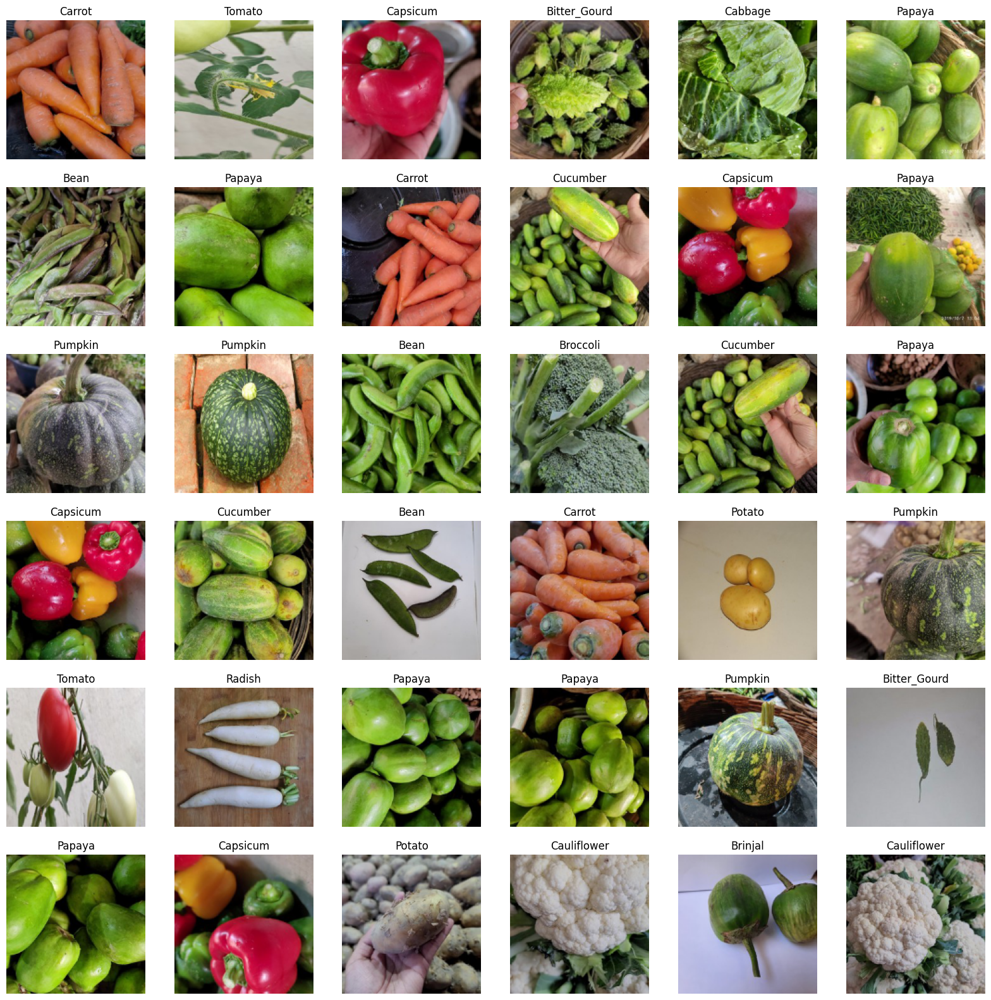

In [ ]:
import numpy as np
plt.figure(figsize = (20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train) , 36))) :
  plt.subplot(6,6,n+1)
  plt.imshow(X_train[i])
  plt.axis('off')
  plt.title(getCode(y_train[i]))

In [ ]:
X_test = []
y_test = []
for folder in os.listdir(test_path) :
  files = gb.glob(pathname=str(test_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    image_array = cv2.resize(image , (size,size))
    X_test.append(list(image_array))
    y_test.append(code[folder])

In [ ]:
print(f'we have {len(X_test)} items in X_test_dataset')
print(f'we have {len(y_test)} items in y_test_dataset')

we have 3000 items in X_test_dataset
we have 3000 items in y_test_dataset


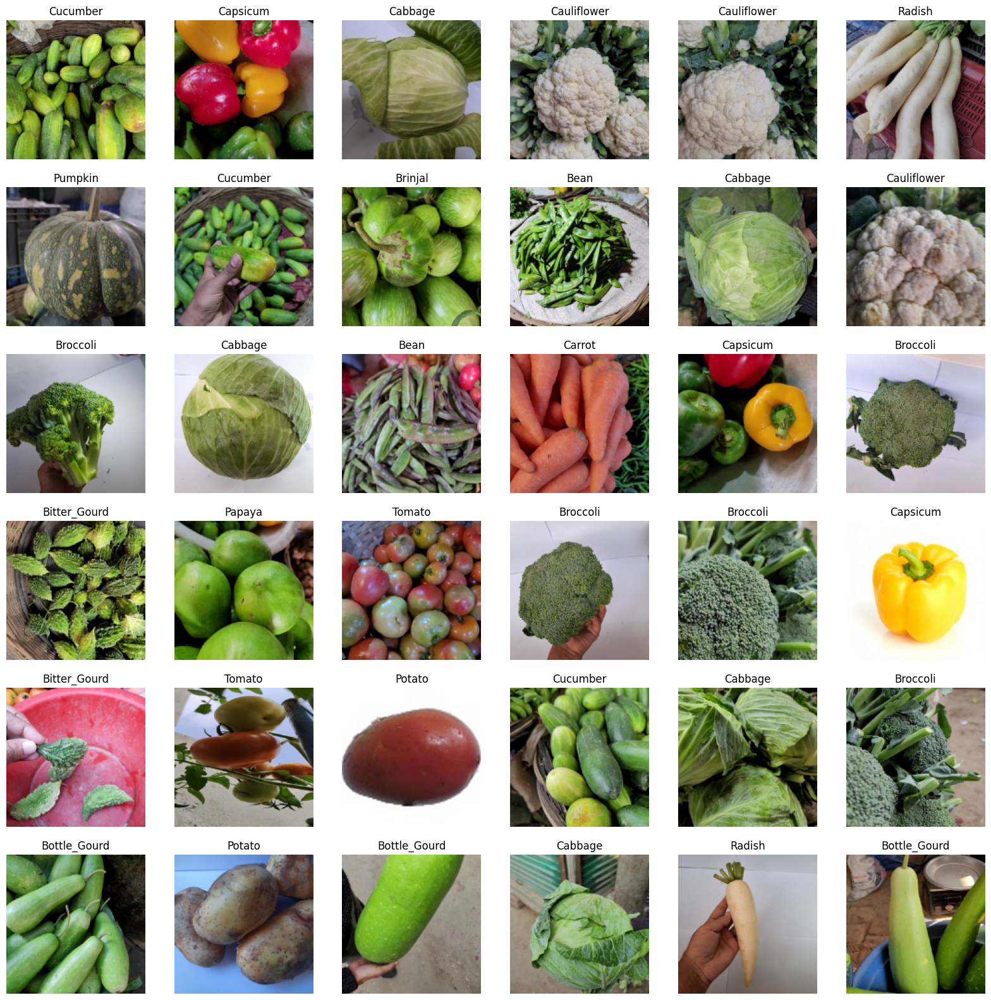

In [ ]:
plt.figure(figsize = (20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test) , 36))) :
  plt.subplot(6,6,n+1)
  plt.imshow(X_test[i])
  plt.axis('off')
  plt.title(getCode(y_test[i]))

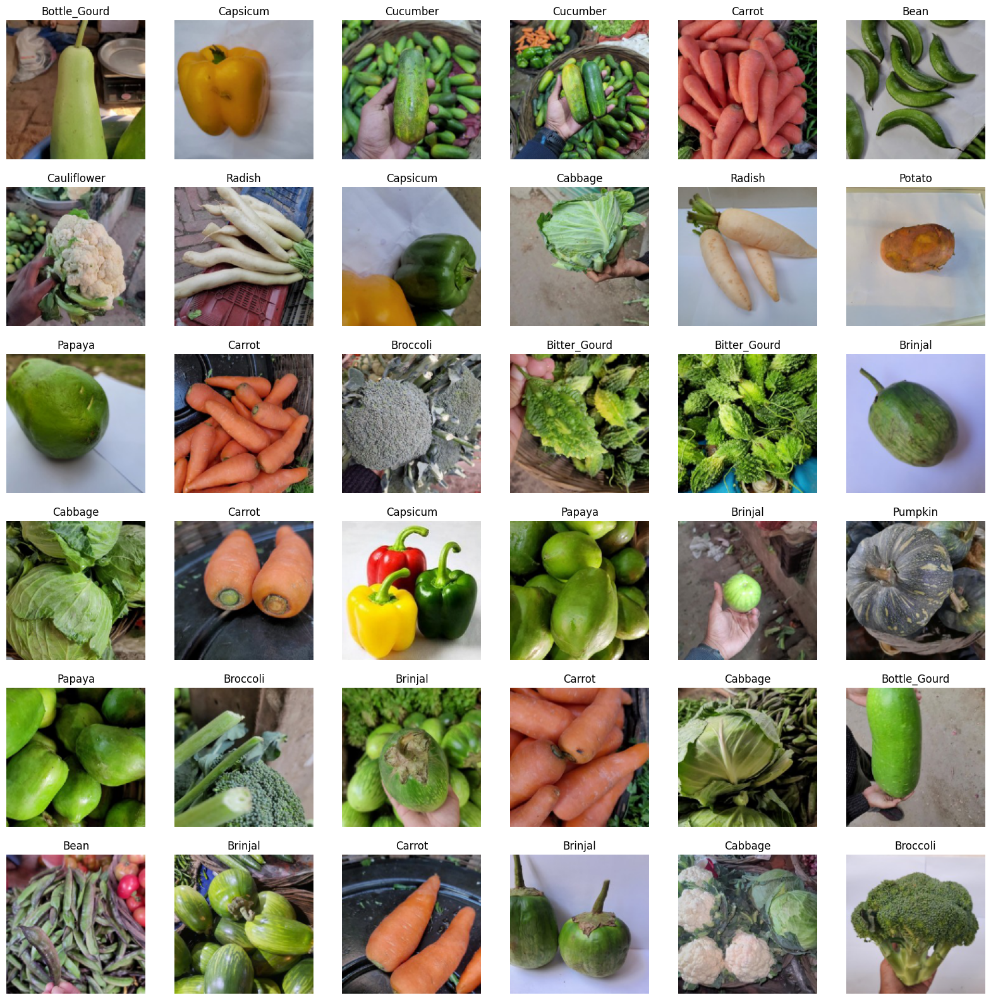

In [ ]:
plt.figure(figsize = (20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test) , 36))) :
  plt.subplot(6,6,n+1)
  plt.imshow(X_test[i])
  plt.axis('off')
  plt.title(getCode(y_test[i]))

In [ ]:
X_val = []
y_val = []
for folder in os.listdir(val_path) :
  files = gb.glob(pathname=str(val_path+"//"+folder+"/*.jpg"))
  for file in files :
    image = plt.imread(file)
    image_array = cv2.resize(image , (size,size))
    X_val.append(list(image_array))
    y_val.append(code[folder])

In [ ]:
print(f'we have {len(X_val)} items in X_val')
print(f'we have {len(y_val)} items in y_val')

we have 3000 items in X_val
we have 3000 items in y_val


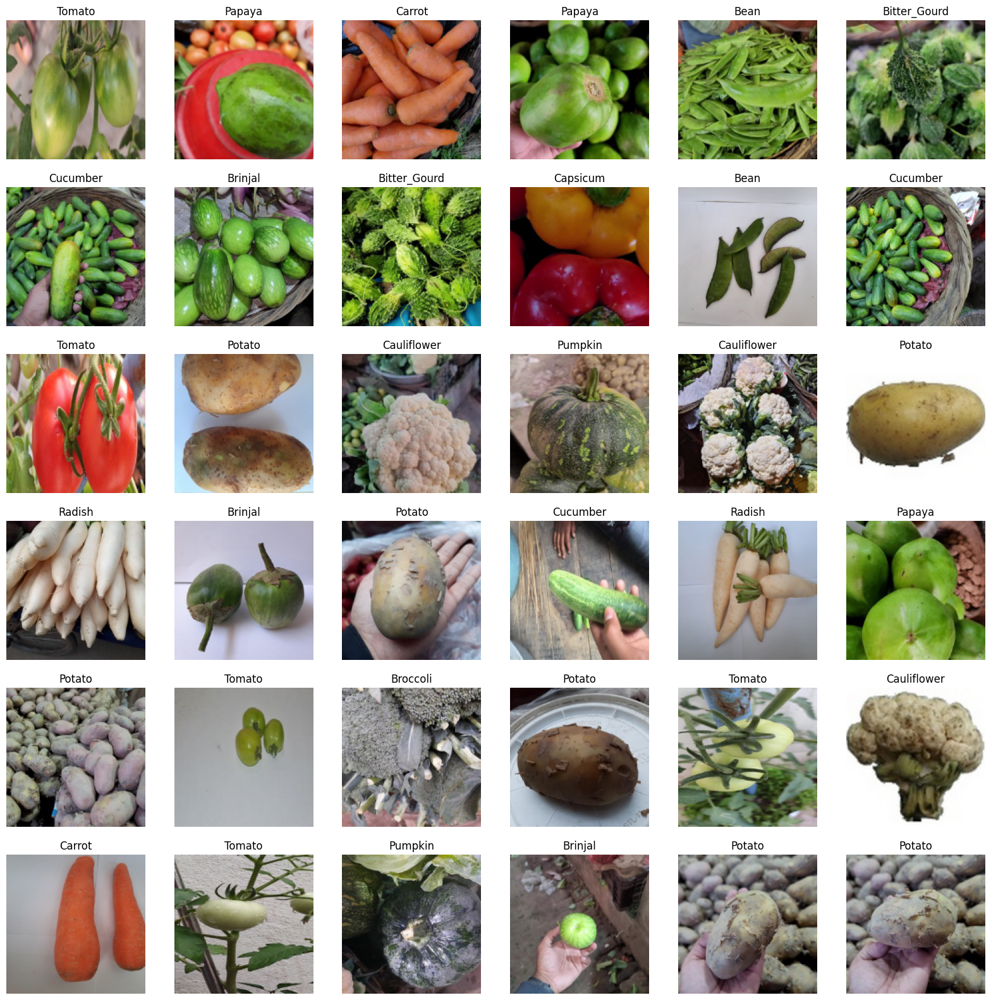

In [ ]:
plt.figure(figsize = (20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_val) , 36))) :
  plt.subplot(6,6,n+1)
  plt.imshow(X_val[i])
  plt.axis('off')
  plt.title(getCode(y_val[i]))

In [ ]:
X_train= np.array(X_train)
y_train = np.array(y_train)

X_test = np.array(X_test)
y_test = np.array(y_test)

X_val = np.array(X_val)
y_val = np.array(y_val)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {y_train.shape}')
print(f'y_train shape  is {X_test.shape}')
print(f'y_test shape  is {y_test.shape}')
print(f'X_val shape  is {X_val.shape}')
print(f'y_val shape  is {y_val.shape}')

X_train shape  is (15000, 150, 150, 3)
X_test shape  is (15000,)
y_train shape  is (3000, 150, 150, 3)
y_test shape  is (3000,)
X_val shape  is (3000, 150, 150, 3)
y_val shape  is (3000,)


In [ ]:
from keras.layers import Dense, BatchNormalization

model = Sequential()

input_shape = (size, size, 3)

model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=input_shape))
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))

model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(15, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 146, 146, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 142, 142, 32)      25632     
                                                                 
 batch_normalization (BatchN  (None, 142, 142, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 71, 71, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 71, 71, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 69, 69, 64)        1

In [ ]:
learning_rate = 0.001
epochs=50
opt = tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate, decay= learning_rate / (epochs * 0.5))
model.compile(optimizer = opt, loss = 'sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
aug = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.15,
    horizontal_flip=False,
    vertical_flip=False,
    fill_mode="nearest")

In [ ]:
history = model.fit(aug.flow(X_train, y_train, batch_size=64), epochs=epochs, validation_data=(X_val, y_val))

Epoch 1/50
235/235 [==============================] - 101s 375ms/step - loss: 2.9554 - accuracy: 0.2725 - val_loss: 2.1534 - val_accuracy: 0.2520
Epoch 2/50
235/235 [==============================] - 83s 352ms/step - loss: 1.9052 - accuracy: 0.3903 - val_loss: 27.0349 - val_accuracy: 0.2107
Epoch 3/50
235/235 [==============================] - 84s 356ms/step - loss: 1.6324 - accuracy: 0.4609 - val_loss: 2.3639 - val_accuracy: 0.4047
Epoch 4/50
235/235 [==============================] - 85s 363ms/step - loss: 1.3467 - accuracy: 0.5578 - val_loss: 3.1395 - val_accuracy: 0.4327
Epoch 5/50
235/235 [==============================] - 83s 353ms/step - loss: 1.1992 - accuracy: 0.6078 - val_loss: 1.2538 - val_accuracy: 0.6190
Epoch 6/50
235/235 [==============================] - 84s 358ms/step - loss: 1.0661 - accuracy: 0.6516 - val_loss: 3.3108 - val_accuracy: 0.5577
Epoch 7/50
235/235 [==============================] - 85s 362ms/step - loss: 0.9459 - accuracy: 0.6915 - val_loss: 0.5507 - val_

In [ ]:
ModelLoss, ModelAccuracy = model.evaluate(X_test, y_test)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy))

94/94 [==============================] - 2s 17ms/step - loss: 0.2070 - accuracy: 0.9573
Test Loss is 0.2070130854845047
Test Accuracy is 0.9573333263397217


In [ ]:
from tensorflow.keras.models import load_model
model.save('/content/drive/MyDrive/CnnModel.hdf5')

In [ ]:
from tensorflow import keras

model_path = '/content/drive/MyDrive/CnnModel.hdf5'
loaded_model = keras.models.load_model(model_path)

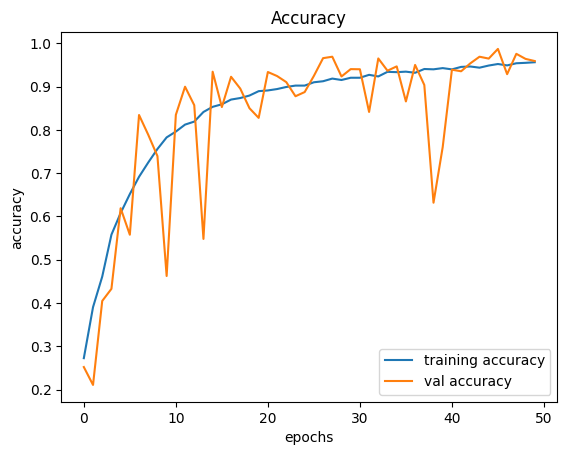

In [ ]:
plt.figure(0)
plt.plot(history.history['accuracy'], label='training accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

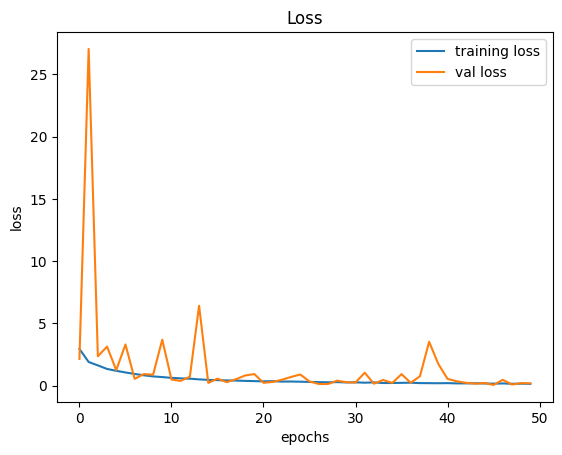

In [ ]:
plt.figure(1)
plt.plot(history.history['loss'], label='training loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

In [ ]:
import seaborn as sns

In [ ]:
predictions = model.predict(X_test)


94/94 [==============================] - 2s 15ms/step


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,np.argmax(predictions, axis=1)))

              precision    recall  f1-score   support

           0       0.96      0.95      0.96       200
           1       0.98      0.98      0.98       200
           2       1.00      0.98      0.99       200
           3       0.92      0.96      0.94       200
           4       0.96      0.95      0.95       200
           5       0.96      0.83      0.89       200
           6       0.99      0.97      0.98       200
           7       1.00      1.00      1.00       200
           8       0.97      0.98      0.97       200
           9       0.98      0.96      0.97       200
          10       0.98      0.98      0.98       200
          11       0.98      0.98      0.98       200
          12       0.77      0.99      0.87       200
          13       0.98      0.95      0.97       200
          14       0.99      0.87      0.93       200

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weighted avg       0.96   

<Axes: >

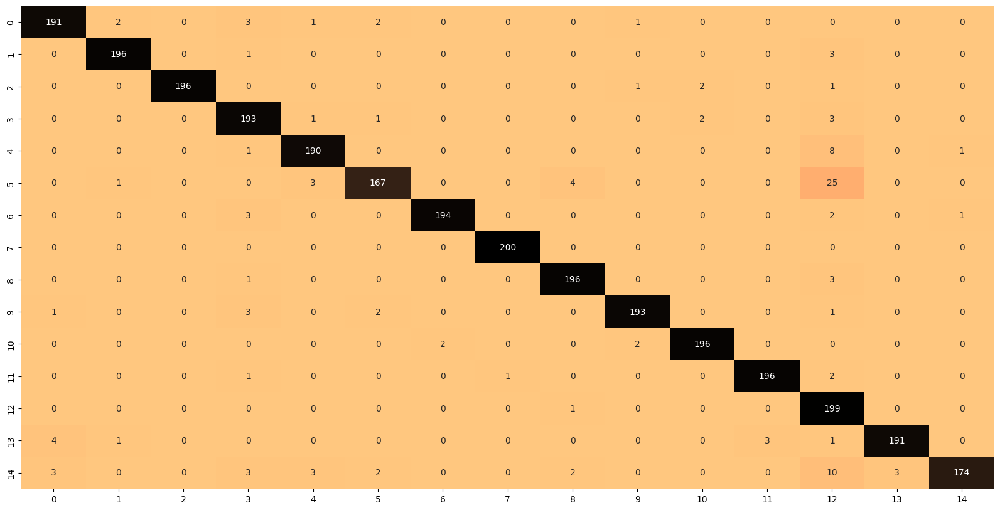

In [ ]:
from sklearn.metrics import confusion_matrix
fig,ax=plt.subplots(figsize=(20,10))
cm = confusion_matrix(y_test, np.argmax(predictions, axis=1))
sns.heatmap(cm,annot=True,cmap="copper_r",fmt="d",cbar=False,ax=ax)


1/1 [==============================] - 0s 190ms/step


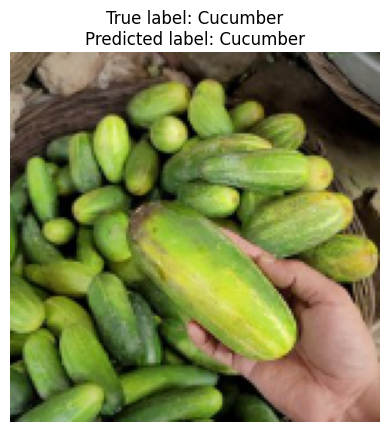

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

y_pred = model.predict(X_test)

# Select a random index from X_test
random_index = random.randint(0, len(X_test) - 1)

# Get the corresponding image and true label
img = X_test[random_index]
true_label = y_test[random_index]
##
x=getCode(true_label)
##
# Reshape the image data to 2D

# Make a prediction for the image
pred_label = np.argmax(model.predict(np.array([img])))
pred_label=getCode(pred_label)
#####

# Plot the image with its true label and predicted label
plt.imshow(img, cmap='gray')
plt.title("True label: {}\nPredicted label: {}".format(x, pred_label))
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 21ms/step


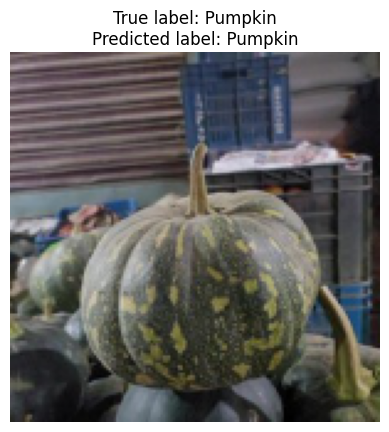

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

y_pred = model.predict(X_test)


random_index = random.randint(0, len(X_test) - 1)


img = X_test[random_index]
true_label = y_test[random_index]

x=getCode(true_label)



pred_label = np.argmax(model.predict(np.array([img])))
pred_label=getCode(pred_label)



plt.imshow(img, cmap='gray')
plt.title("True label: {}\nPredicted label: {}".format(x, pred_label))
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 31ms/step


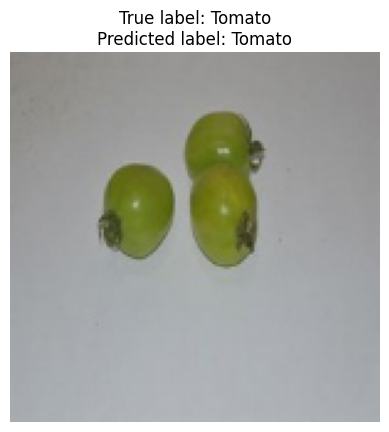

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

y_pred = model.predict(X_test)


random_index = random.randint(0, len(X_test) - 1)


img = X_test[random_index]
true_label = y_test[random_index]

x=getCode(true_label)


pred_label = np.argmax(model.predict(np.array([img])))
pred_label=getCode(pred_label)


plt.imshow(img, cmap='gray')
plt.title("True label: {}\nPredicted label: {}".format(x, pred_label))
plt.axis('off')
plt.show()